# Exploring json paths files
- Starting analysis of json path files after path processing step
- json files contain the datetime of the video which was used to generate them
- Each file consists of a list of objects:
    - bee_id: Unique number id of the bee path in the file
    - start_frame_nums: List of the frame numbers that the paths of the bees started at
    - tag_class: Consensus tag classification
    - x_paths: List of lists containing all the uninterrupted x coordinates from each path 
    - y_paths: List of lists containing all the uninterrupted y coordinates from each path 

In [1]:
%matplotlib inline
#plt.style.use('ggplot')
from pylab import rcParams
rcParams['figure.figsize'] = 16, 12

%load_ext autoreload
%autoreload 2

%load_ext version_information
%version_information numpy, scipy, matplotlib, pandas

Software versions
Python 2.7.12 64bit [GCC 5.4.0 20160609]
IPython 5.4.1
OS Linux 4.10.0 32 generic x86_64 with Ubuntu 16.04 xenial
numpy 1.13.1
scipy 0.19.1
matplotlib 2.0.2
pandas 0.20.3
Wed Aug 23 10:55:48 2017 AEST

In [2]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd

import os
import sys
import glob
import json
import cv2
from datetime import datetime

np.random.seed(0)

In [3]:
def get_video_filename(file_path):
    head, tail = os.path.split(file_path)
    str_date_time = os.path.splitext(tail)[0]
    return str_date_time

def get_video_datetime(file_path):
    video_filename = get_video_filename(file_path)
    return datetime.strptime(video_filename, "%Y-%m-%d_%H-%M-%S")

def get_daily_bg_datetime(file_path):
    video_filename = get_video_filename(file_path)
    return datetime.strptime(video_filename, "%Y-%m-%d")

def read_json(coord_file_path):
    with open(coord_file_path) as json_file:
        coords_data = json.load(json_file)
    return coords_data

In [4]:
def read_all_processed_paths_files(processed_paths_dir):
    if processed_paths_dir[-1] != '/':
        processed_paths_dir += '/'
    json_file_list = glob.glob(processed_paths_dir + '*.json')
    
    video_dt_paths = []
    for json_file in json_file_list:
        path_data = read_json(json_file)
        video_date_time = get_video_datetime(json_file)
        video_dt_paths.append({'date_time': video_date_time, 'paths': path_data})
        
    sorted_video_dt_paths = sorted(video_dt_paths, key=lambda k: k['date_time']) 
    return sorted_video_dt_paths

In [5]:
processed_paths_dir = '/home/jack/Data/Caffeine_Unique_Tags/processed/'
video_dt_paths = read_all_processed_paths_files(processed_paths_dir)

In [6]:
for p in video_dt_paths:
    print(p['date_time'], p['date_time'].date())

(datetime.datetime(2017, 2, 14, 23, 32), datetime.date(2017, 2, 14))
(datetime.datetime(2017, 2, 15, 0, 32), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 1, 32, 2), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 2, 32), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 3, 32), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 4, 32), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 5, 32), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 6, 32, 3), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 7, 32, 1), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 8, 32, 4), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 9, 32, 2), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 10, 32, 5), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 11, 32, 6), datetime.date(2017, 2, 15))
(datetime.datetime(2017, 2, 15, 12, 32, 4), datetime.date(2017, 2, 15))
(datetime.datetime(2

In [17]:
# experiments start filming in the evening
is_night = True
# night between 7pm-7am
night_hours = [19,20,21,22,23,0,1,2,3,4,5,6]
for p in video_dt_paths:
    hour = p['date_time'].hour
    if is_night:
        if hour in night_hours:
            print('night ', hour)
        else:
            is_night = False
            print('day ', hour)
    else:
        if hour not in night_hours:
            print('day ', hour)
        else:
            is_night = True
            print('night ', hour)

('night ', 23)
('night ', 0)
('night ', 1)
('night ', 2)
('night ', 3)
('night ', 4)
('night ', 5)
('night ', 6)
('day ', 7)
('day ', 8)
('day ', 9)
('day ', 10)
('day ', 11)
('day ', 12)
('day ', 13)
('day ', 14)
('day ', 15)
('day ', 16)
('day ', 17)
('day ', 18)
('night ', 19)
('night ', 20)
('night ', 21)
('night ', 22)
('night ', 23)
('night ', 0)
('night ', 1)
('night ', 2)
('night ', 3)
('night ', 4)
('night ', 5)
('night ', 6)
('day ', 7)
('day ', 8)
('day ', 9)
('day ', 10)
('day ', 11)
('day ', 12)
('day ', 13)
('day ', 14)
('day ', 15)
('day ', 16)
('day ', 17)
('day ', 18)
('night ', 19)
('night ', 20)
('night ', 21)
('night ', 22)
('night ', 23)
('night ', 0)
('night ', 1)
('night ', 2)
('night ', 3)
('night ', 4)
('night ', 5)
('night ', 6)
('day ', 7)
('day ', 8)
('day ', 9)
('day ', 10)
('day ', 11)
('day ', 12)
('day ', 13)
('day ', 14)
('day ', 15)
('day ', 16)
('day ', 17)
('day ', 18)
('night ', 19)
('night ', 20)
('night ', 21)
('night ', 22)
('night ', 23)
('night

In [22]:
class NightDayData():
    def __init__(self):
        # experiments start filming in the evening
        self.is_night = True
        # night between 7pm-7am
        self.night_hours = [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6]

        self.current_data_list = []
        self.night_data_lists = []
        self.day_data_lists = []

    def sort_data_into_time_period(self, hour, hour_data):
        if self.is_night:
            if hour in self.night_hours:
                self.current_data_list.append(hour_data)
            else:
                self.night_data_lists.append(self.current_data_list)
                self.current_data_list = [hour_data]
                self.is_night = False
        else:
            if hour not in self.night_hours:
                self.current_data_list.append(hour_data)
            else:
                self.day_data_lists.append(self.current_data_list)
                self.current_data_list = [hour_data]
                self.is_night = True

    def get_night_day_data_lists(self):
        if len(self.current_data_list) > 0:
            if self.is_night:
                self.night_data_lists.append(self.current_data_list)
            else:
                self.day_data_lists.append(self.current_data_list)
            self.current_data_list = []

        return {'night': self.night_data_lists, 'day': self.day_data_lists}

In [24]:
ndd = NightDayData()
for p in video_dt_paths:
    hour = p['date_time'].hour
    ndd.sort_data_into_time_period(hour, hour)
    
data_lists = ndd.get_night_day_data_lists()
print(data_lists['night'])
print(data_lists['day'])

[[23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 20, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6], [19, 20, 21, 22, 23, 0, 1, 2, 3, 4, 5, 6]]
[[7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18

In [7]:
def read_all_daily_bg_images(daily_bg_dir):
    if daily_bg_dir[-1] != '/':
        daily_bg_dir += '/'
    bg_file_list = glob.glob(daily_bg_dir + '*.png')
    
    dt_bg_images_dict = {}
    for bg_file in bg_file_list:
        bg_image = cv2.imread(bg_file, cv2.IMREAD_GRAYSCALE)
        bg_date_time = get_daily_bg_datetime(bg_file)
        dt_bg_images_dict[bg_date_time.date()] = bg_image
        
    return dt_bg_images_dict

In [8]:
daily_bg_dir = '/home/jack/Data/Caffeine_Unique_Tags/daily_background/'
dt_bg_images_dict = read_all_daily_bg_images(daily_bg_dir)

In [9]:
paths_in_time_period = {k:[] for k in dt_bg_images_dict.keys()}  
for dt_path in video_dt_paths:
    date = dt_path['date_time'].date()
    for bee in dt_path['paths']:
        # check if it is the queen
        if bee['tag_class'] != 50: #32
            continue
        for path_index in range(len(bee['x_paths'])):
            paths_in_time_period[date].append((bee['x_paths'][path_index], bee['y_paths'][path_index]))

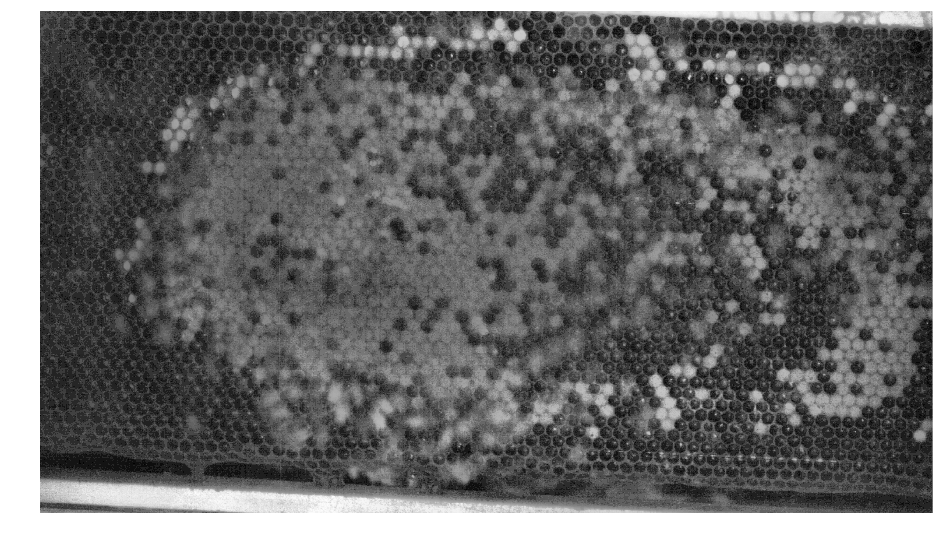

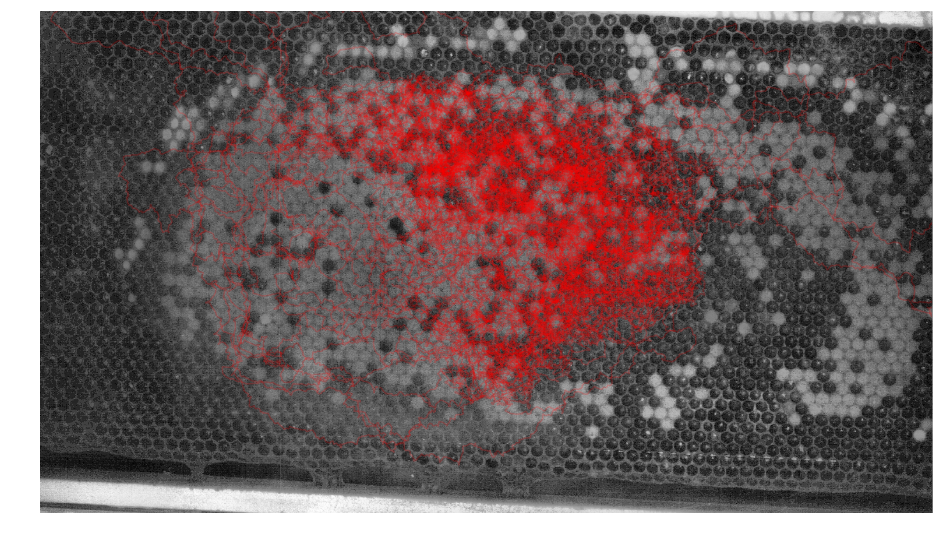

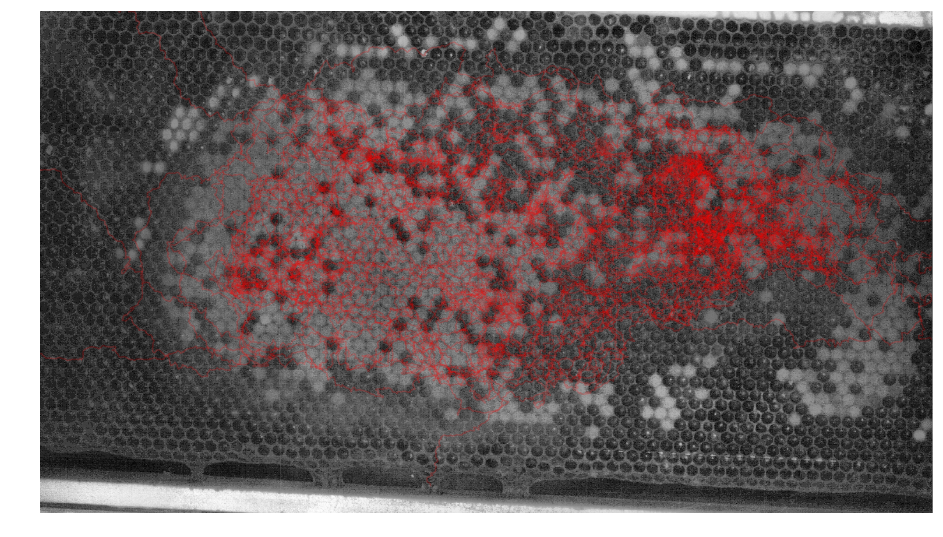

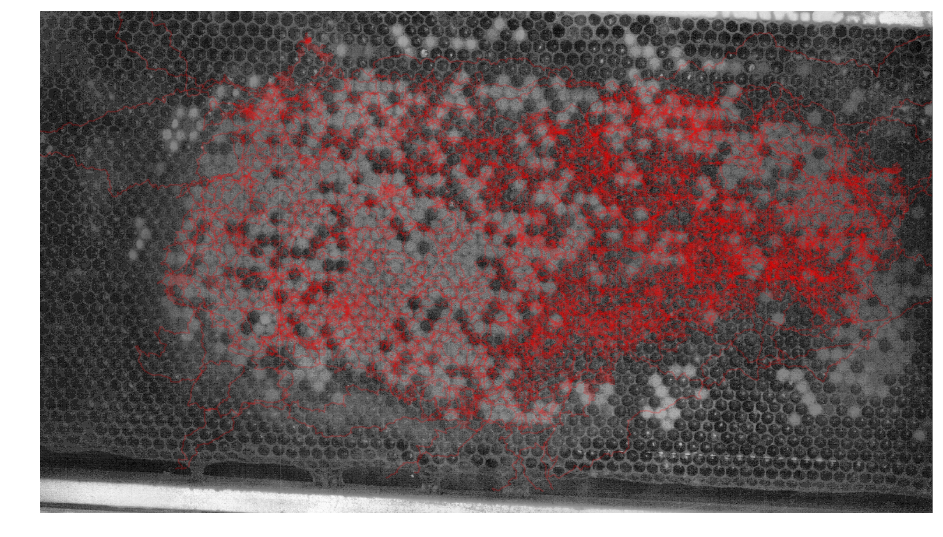

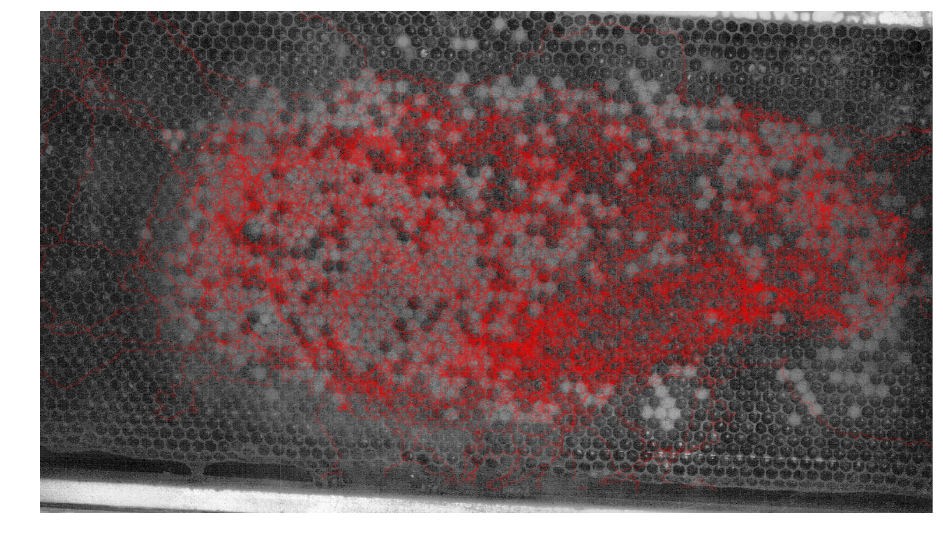

...

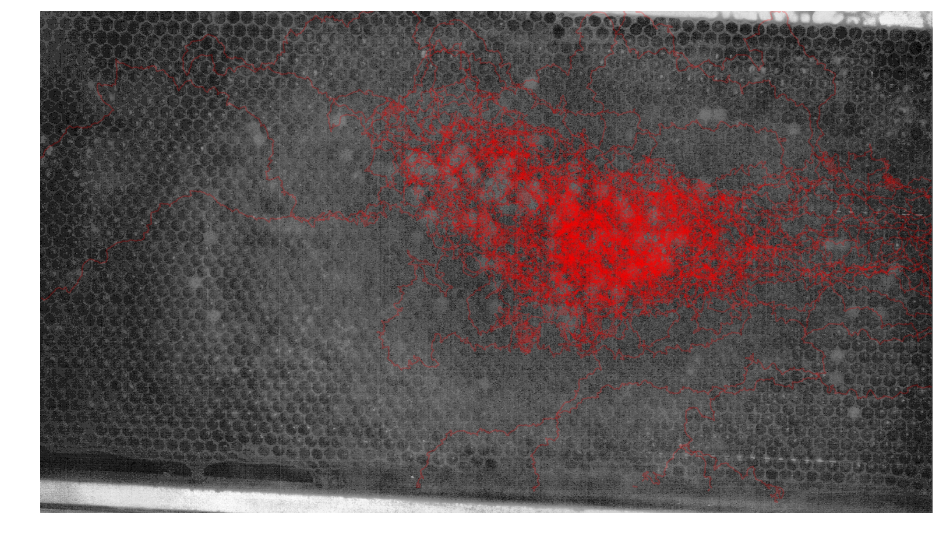

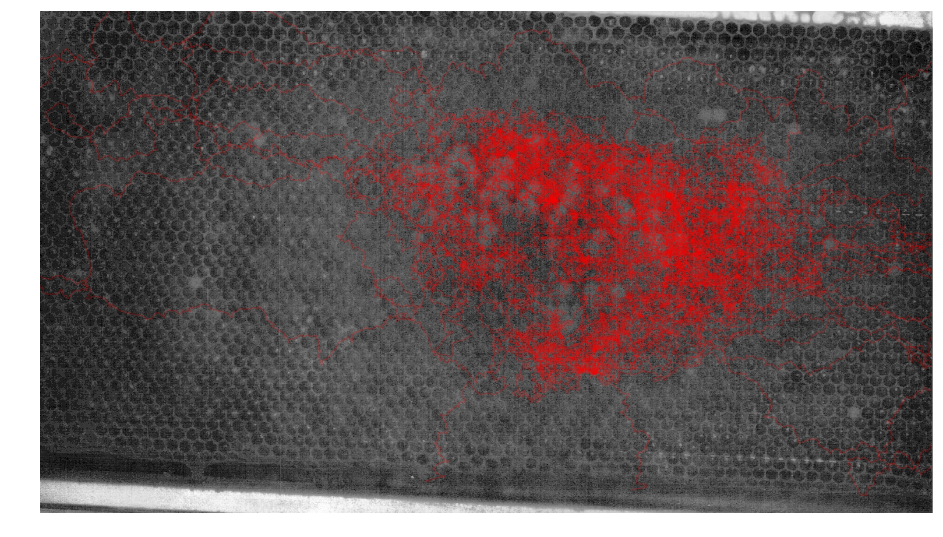

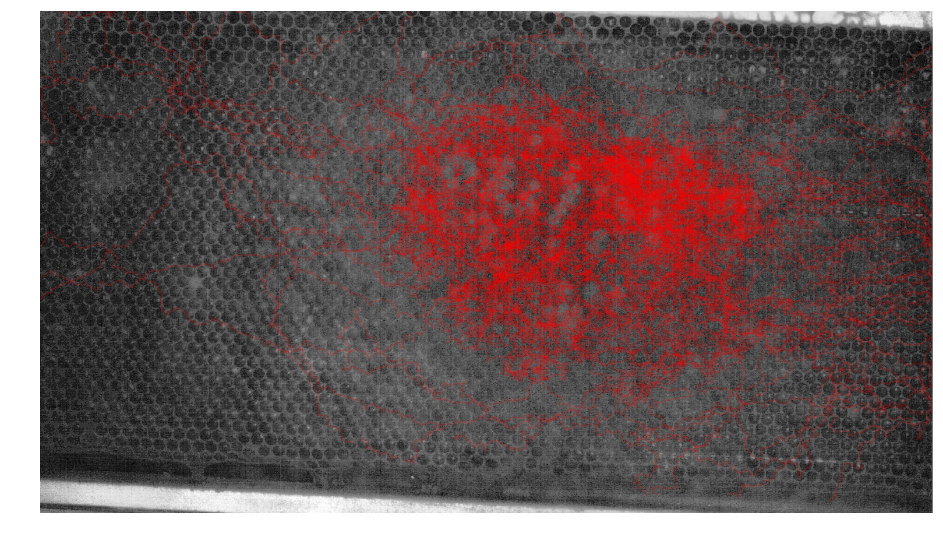

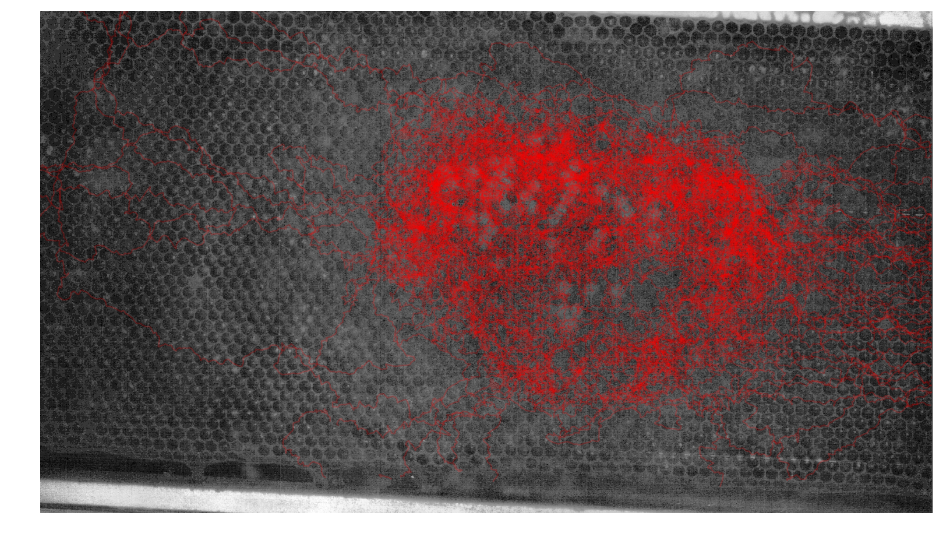

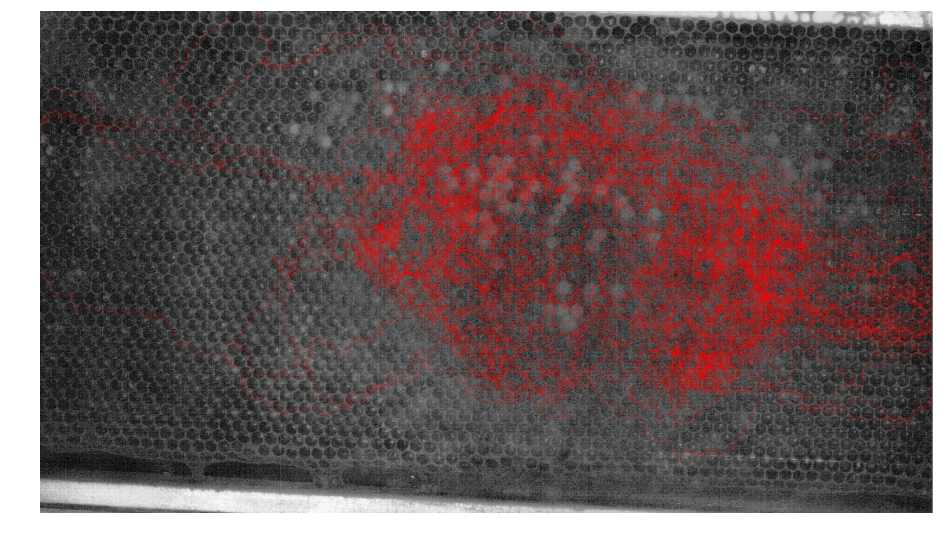

In [10]:
date_time_list = list(paths_in_time_period.keys())
date_time_list.sort()

for date_time in date_time_list:
    plt.figure()
    for xy_path in paths_in_time_period[date_time]:
        plt.plot(xy_path[0], xy_path[1], alpha=0.2, color='r')
        
    plt.imshow(dt_bg_images_dict[date_time], cmap = cm.Greys_r)
    plt.axis('off')
    #plt.savefig(str(date_time) + '.png', dpi=300)
    plt.show()